In [19]:
%load_ext autoreload
%autoreload 2

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (12, 8)
plt.rcParams["font.size"] = 12

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [20]:
import xarray as xr

import xarray_sentinel

In [21]:
# uncomment download the data
#! DHUS_USER=<user> DHUS_PASSWORD=<password> ./download_data.sh

In [22]:
productID = "S1A_IW_GRDH_1SDV_20170508T164830_20170508T164855_016493_01B54C_8604"
url = f"https://objectstore.eodc.eu:2222/e05ab01a9d56408d82ac32d69a5aae2a:sample-data/tutorial_data/cpm_b716/{productID}.zarr"

In [23]:
product_path = (url)
swath_group = "IW"
swath_polarisation_group = "IW/VV"
measurement_group = "IW/VV"
measurement_block_slices = (slice(7000, 9000), slice(20000, 23000))
digital_number_max = 600

!ls -d {product_path}

ls: https://objectstore.eodc.eu:2222/e05ab01a9d56408d82ac32d69a5aae2a:sample-data/tutorial_data/cpm_b716/S1A_IW_GRDH_1SDV_20170508T164830_20170508T164855_016493_01B54C_8604.zarr: No such file or directory


In [25]:
xr.open_dataset(url, engine="zarr")

<xarray.Dataset> Size: 0B
Dimensions:  ()
Data variables:
    *empty*
Attributes:
    other_metadata:  {'eopf_category': 'eocontainer', 'history': [{'output': ...
    stac_discovery:  {'assets': {}, 'bbox': [18.683729, 39.116356, 15.305539,...

In [6]:
#xr.open_dataset(url, engine="zarr", group=swath_group)

In [26]:
xr.open_dataset(url, engine="zarr", group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH")

<xarray.Dataset> Size: 0B
Dimensions:  ()
Data variables:
    *empty*
Attributes:
    other_metadata:  {'azimuth_steering_rate': 1.590368784, 'downlink_informa...
    stac_discovery:  {'assets': {}, 'bbox': [18.683729, 39.116356, 15.305539,...

In [28]:
measurement = xr.open_dataset(
    url, engine="zarr", group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH/measurements", chunks={}
)
measurement

<xarray.Dataset> Size: 877MB
Dimensions:       (azimuth_time: 16694, ground_range: 26239)
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 134kB 2017-05-08T16:48:30.467...
  * ground_range  (ground_range) float64 210kB 0.0 10.0 ... 2.624e+05 2.624e+05
    line          (azimuth_time) int64 134kB dask.array<chunksize=(16694,), meta=np.ndarray>
    pixel         (ground_range) int64 210kB dask.array<chunksize=(26239,), meta=np.ndarray>
Data variables:
    grd           (azimuth_time, ground_range) uint16 876MB dask.array<chunksize=(2557, 26239), meta=np.ndarray>

In [29]:
measurement_block = measurement.grd
measurement_block = measurement_block.isel(
    azimuth_time=slice(None, None, 10), ground_range=slice(None, None, 10)
)
measurement_block

<xarray.DataArray 'grd' (azimuth_time: 1670, ground_range: 2624)> Size: 9MB
dask.array<getitem, shape=(1670, 2624), dtype=uint16, chunksize=(256, 2624), chunktype=numpy.ndarray>
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 13kB 2017-05-08T16:48:30.4679...
  * ground_range  (ground_range) float64 21kB 0.0 100.0 ... 2.622e+05 2.623e+05
    line          (azimuth_time) int64 13kB dask.array<chunksize=(1670,), meta=np.ndarray>
    pixel         (ground_range) int64 21kB dask.array<chunksize=(2624,), meta=np.ndarray>
Attributes:
    _eopf_attrs:  {'coordinates': ['azimuth_time', 'line', 'pixel', 'ground_r...
    dtype:        <u2
    long_name:    measurement data set for GRD IW

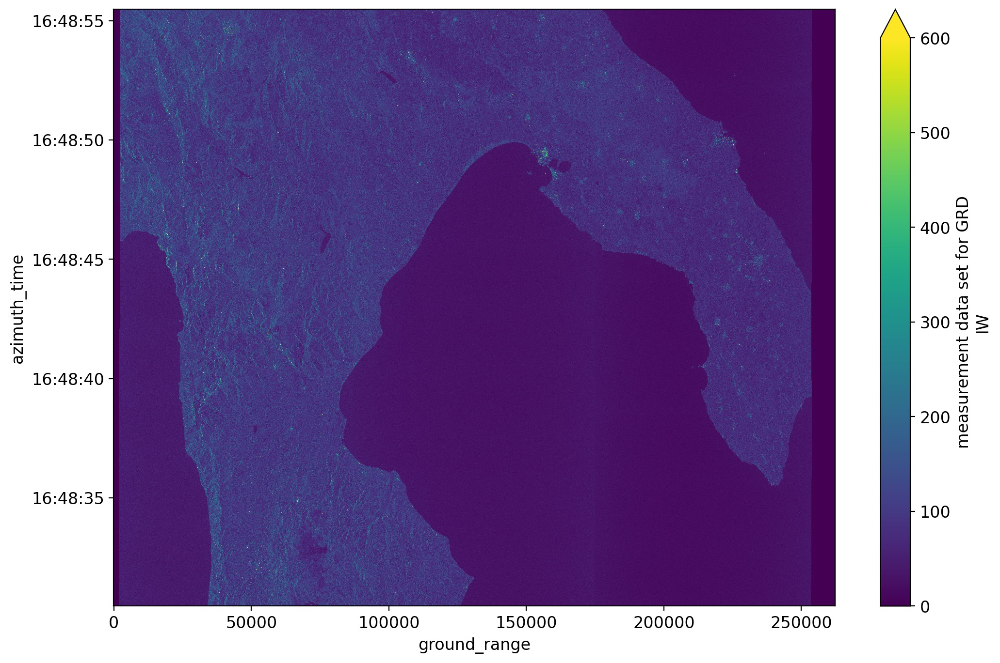

In [30]:
measurement_block.plot(y="azimuth_time", vmax=digital_number_max)

In [31]:
gcp = xr.open_dataset(
    url, engine="zarr", group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH/conditions/gcp"
)
gcp

<xarray.Dataset> Size: 12kB
Dimensions:               (azimuth_time: 10, ground_range: 21)
Coordinates:
  * azimuth_time          (azimuth_time) datetime64[ns] 80B 2017-05-08T16:48:...
  * ground_range          (ground_range) float64 168B 0.0 ... 2.624e+05
    line                  (azimuth_time) uint32 40B ...
    pixel                 (ground_range) uint32 84B ...
Data variables:
    azimuth_time_gcp      (azimuth_time, ground_range) datetime64[ns] 2kB ...
    elevation_angle       (azimuth_time, ground_range) float64 2kB ...
    height                (azimuth_time, ground_range) float64 2kB ...
    incidence_angle       (azimuth_time, ground_range) float64 2kB ...
    latitude              (azimuth_time, ground_range) float64 2kB ...
    longitude             (azimuth_time, ground_range) float64 2kB ...
    slant_range_time_gcp  (azimuth_time, ground_range) float64 2kB ...

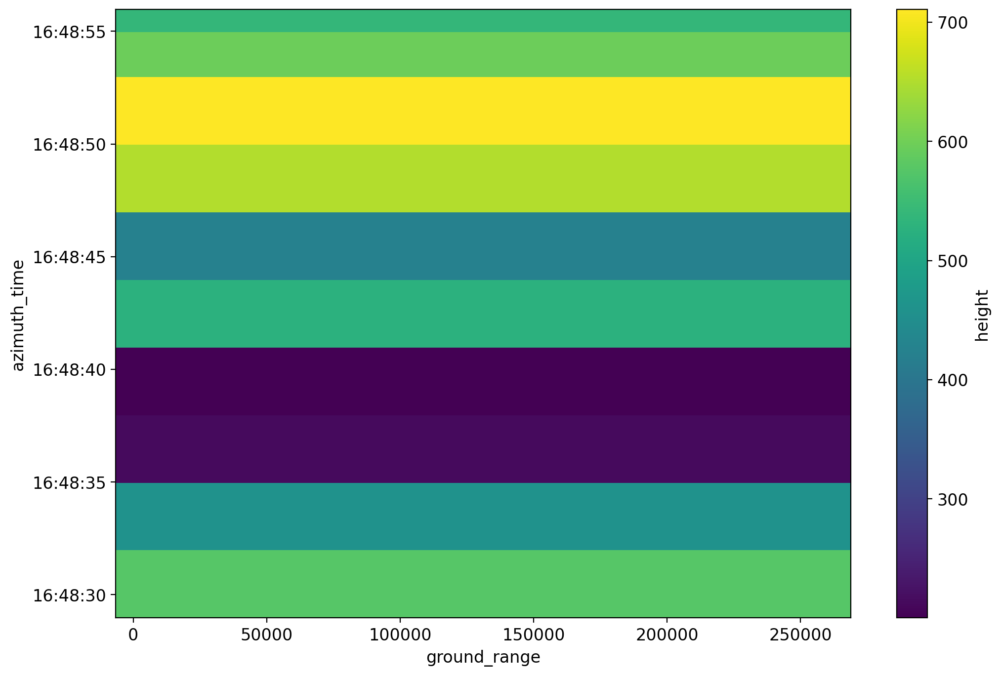

In [32]:
_ = gcp.height.plot(y="azimuth_time")

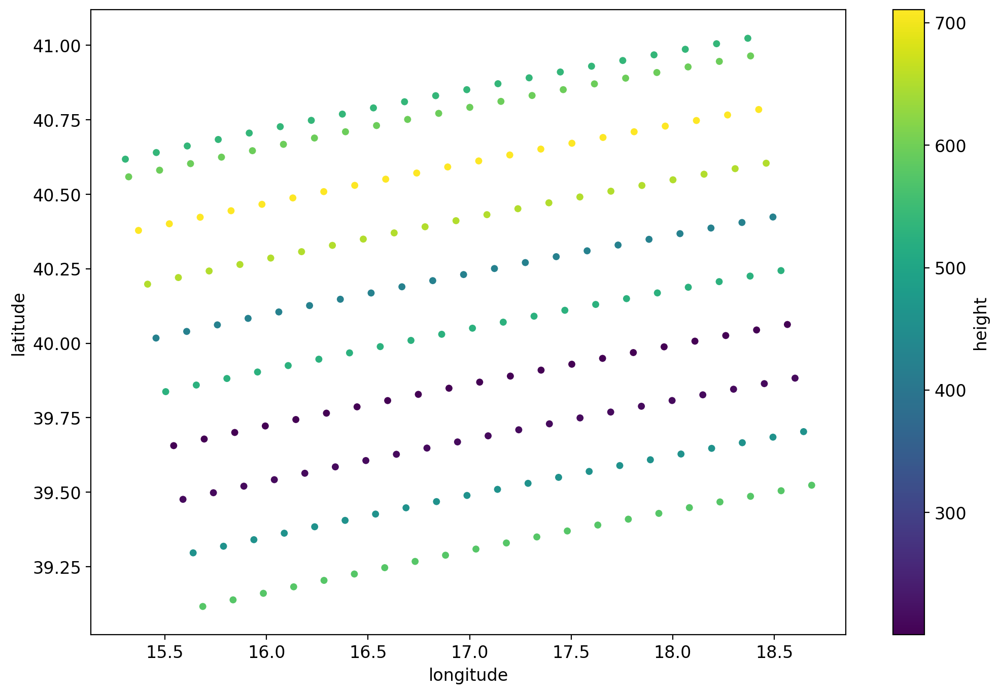

In [33]:
_ = gcp.plot.scatter(x="longitude", y="latitude", hue="height")

In [85]:
gcp_iterpolated = gcp.interp_like(measurement_block)
gcp_iterpolated

<xarray.Dataset> Size: 210MB
Dimensions:               (azimuth_time: 1670, ground_range: 2624)
Coordinates:
    line                  (azimuth_time) float64 13kB 0.0 10.0 ... 1.669e+04
    pixel                 (ground_range) float64 21kB 0.0 10.0 ... 2.623e+04
  * azimuth_time          (azimuth_time) datetime64[ns] 13kB 2017-05-08T16:48...
  * ground_range          (ground_range) float64 21kB 0.0 100.0 ... 2.623e+05
Data variables:
    elevation_angle       (azimuth_time, ground_range) float64 35MB 27.32 ......
    height                (azimuth_time, ground_range) float64 35MB 576.8 ......
    incidence_angle       (azimuth_time, ground_range) float64 35MB 30.62 ......
    latitude              (azimuth_time, ground_range) float64 35MB 39.12 ......
    longitude             (azimuth_time, ground_range) float64 35MB 15.69 ......
    slant_range_time_gcp  (azimuth_time, ground_range) float64 35MB 0.005337 ...

In [35]:
orbit = xr.open_dataset(
    url, engine="zarr", group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH/conditions/orbit"
)
orbit

<xarray.Dataset> Size: 952B
Dimensions:       (azimuth_time: 17, axis: 3)
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 136B 2017-05-08T16:47:24.0541...
Dimensions without coordinates: axis
Data variables:
    position      (azimuth_time, axis) float64 408B ...
    velocity      (azimuth_time, axis) float64 408B ...

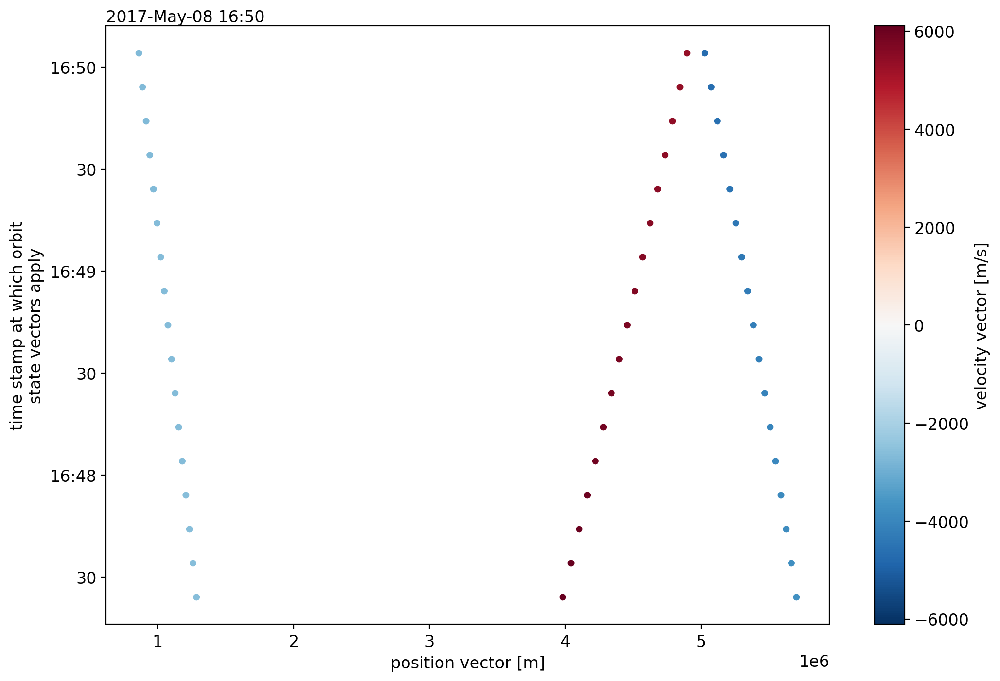

In [36]:
orbit.plot.scatter(y="azimuth_time", x="position", hue="velocity")

In [37]:
calibration = xr.open_dataset(
    url, engine="zarr", group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH/quality/calibration"
)
calibration

<xarray.Dataset> Size: 292kB
Dimensions:       (azimuth_time: 27, ground_range: 657)
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 216B 2017-05-08T16:48:30.4679...
  * ground_range  (ground_range) float64 5kB 0.0 6.677e+06 ... 4.38e+09
    line          (azimuth_time) uint32 108B ...
    pixel         (ground_range) uint32 3kB ...
Data variables:
    beta_nought   (azimuth_time, ground_range) float32 71kB ...
    dn            (azimuth_time, ground_range) float32 71kB ...
    gamma         (azimuth_time, ground_range) float32 71kB ...
    sigma_nought  (azimuth_time, ground_range) float32 71kB ...

In [38]:
# betaNought and dn calibration are typically constat
print(calibration.beta_nought.mean().item(), "+-", calibration.beta_nought.std().item())
print(calibration.dn.mean().item(), "+-", calibration.dn.std().item())

474.0 +- 0.0
474.0 +- 0.0


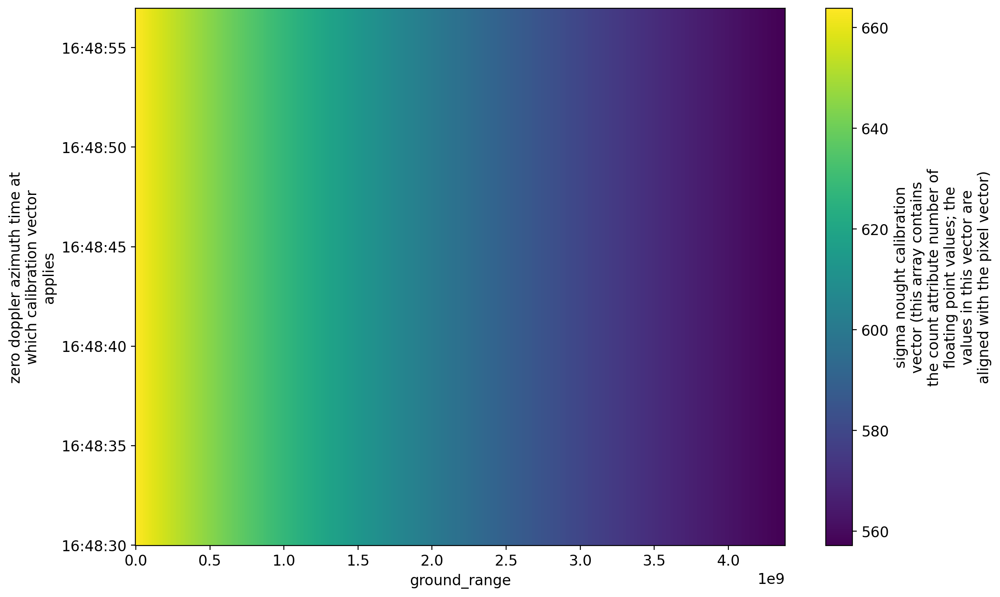

In [42]:
_ = calibration.sigma_nought.plot()

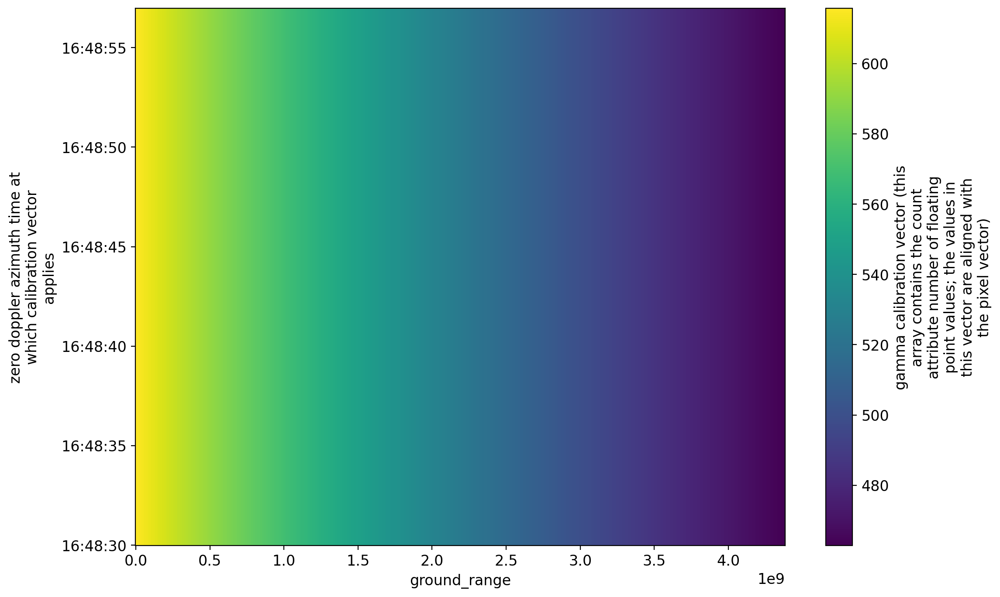

In [44]:
_ = calibration.gamma.plot()

In [86]:
measurement_block = measurement_block.assign_coords(
    {"latitude": gcp_iterpolated.latitude, "longitude": gcp_iterpolated.longitude}
)
measurement_block

<xarray.DataArray 'grd' (azimuth_time: 1670, ground_range: 2624)> Size: 9MB
dask.array<getitem, shape=(1670, 2624), dtype=uint16, chunksize=(256, 2624), chunktype=numpy.ndarray>
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 13kB 2017-05-08T16:48:30.4679...
  * ground_range  (ground_range) float64 21kB 0.0 100.0 ... 2.622e+05 2.623e+05
    line          (azimuth_time) float64 13kB 0.0 10.0 ... 1.668e+04 1.669e+04
    pixel         (ground_range) float64 21kB 0.0 10.0 ... 2.622e+04 2.623e+04
    latitude      (azimuth_time, ground_range) float64 35MB 39.12 ... 41.02
    longitude     (azimuth_time, ground_range) float64 35MB 15.69 ... 18.37
Attributes:
    _eopf_attrs:  {'coordinates': ['azimuth_time', 'line', 'pixel', 'ground_r...
    dtype:        <u2
    long_name:    measurement data set for GRD IW

In [87]:
betaNought_block = xarray_sentinel.calibrate_amplitude(
    measurement_block, calibration.beta_nought
)
betaNought_block

<xarray.DataArray (azimuth_time: 1670, ground_range: 2624)> Size: 18MB
dask.array<truediv, shape=(1670, 2624), dtype=float32, chunksize=(256, 2624), chunktype=numpy.ndarray>
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 13kB 2017-05-08T16:48:30.4679...
  * ground_range  (ground_range) float64 21kB 0.0 100.0 ... 2.622e+05 2.623e+05
    line          (azimuth_time) float64 13kB 0.0 10.0 ... 1.668e+04 1.669e+04
    pixel         (ground_range) float64 21kB 0.0 10.0 ... 2.622e+04 2.623e+04
    latitude      (azimuth_time, ground_range) float64 35MB 39.12 ... 41.02
    longitude     (azimuth_time, ground_range) float64 35MB 15.69 ... 18.37
Attributes:
    _eopf_attrs:  {'coordinates': ['azimuth_time', 'line', 'pixel', 'ground_r...
    dtype:        <u2
    long_name:    amplitude for beta nought calibration vector (this array co...

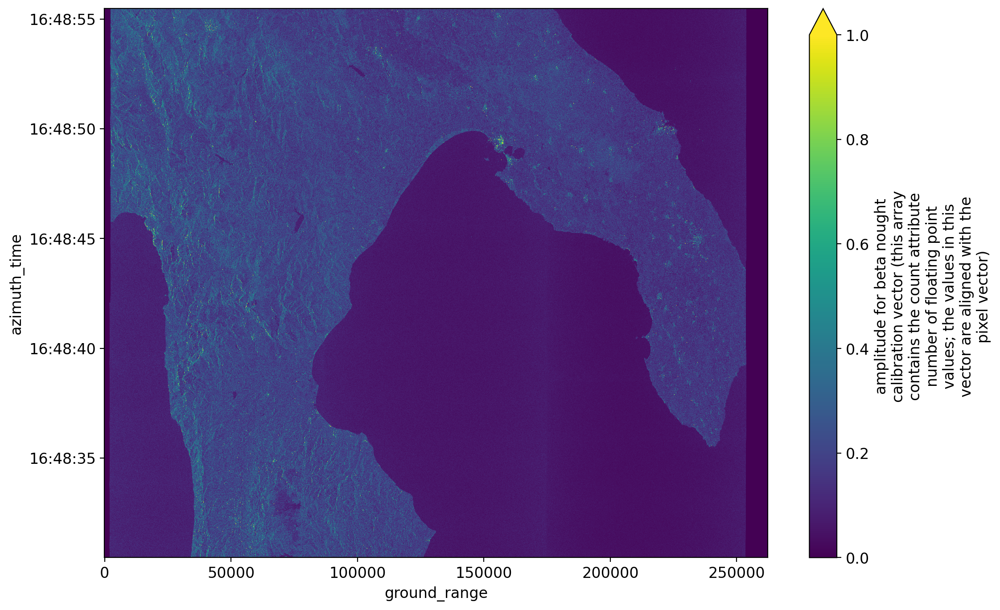

In [88]:
_ = abs(betaNought_block).plot(y="azimuth_time", vmax=1)

In [89]:
betaNought_block_db = xarray_sentinel.calibrate_intensity(
    measurement_block, calibration.beta_nought, as_db=True
)
betaNought_block_db

<xarray.DataArray (azimuth_time: 1670, ground_range: 2624)> Size: 18MB
dask.array<maximum, shape=(1670, 2624), dtype=float32, chunksize=(256, 2624), chunktype=numpy.ndarray>
Coordinates:
  * azimuth_time  (azimuth_time) datetime64[ns] 13kB 2017-05-08T16:48:30.4679...
  * ground_range  (ground_range) float64 21kB 0.0 100.0 ... 2.622e+05 2.623e+05
    line          (azimuth_time) float64 13kB 0.0 10.0 ... 1.668e+04 1.669e+04
    pixel         (ground_range) float64 21kB 0.0 10.0 ... 2.622e+04 2.623e+04
    latitude      (azimuth_time, ground_range) float64 35MB 39.12 ... 41.02
    longitude     (azimuth_time, ground_range) float64 35MB 15.69 ... 18.37
Attributes:
    _eopf_attrs:  {'coordinates': ['azimuth_time', 'line', 'pixel', 'ground_r...
    dtype:        <u2
    long_name:    beta nought calibration vector (this array contains the cou...
    units:        dB

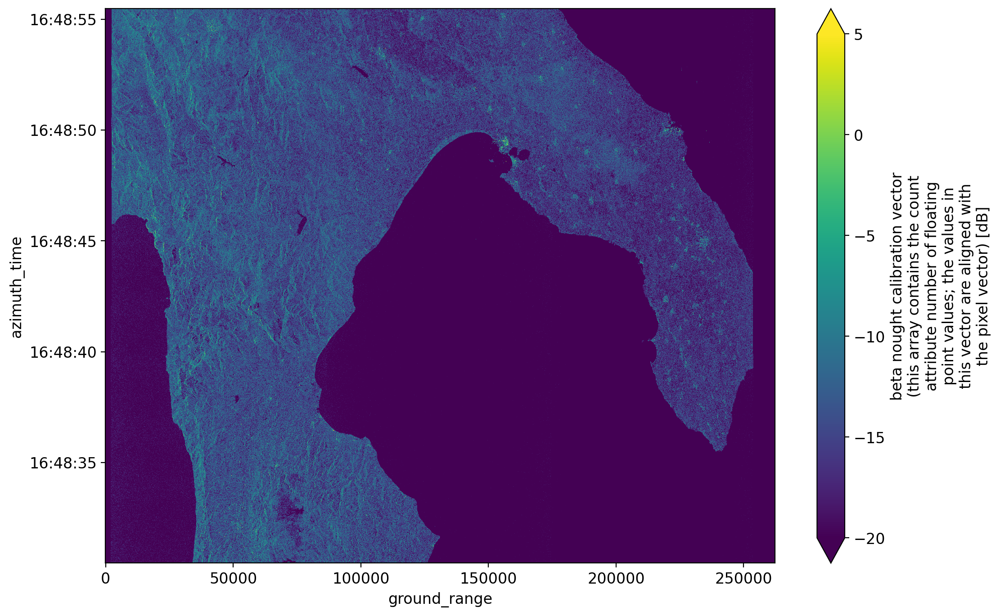

In [90]:
_ = betaNought_block_db.plot(y="azimuth_time", vmin=-20, vmax=5)

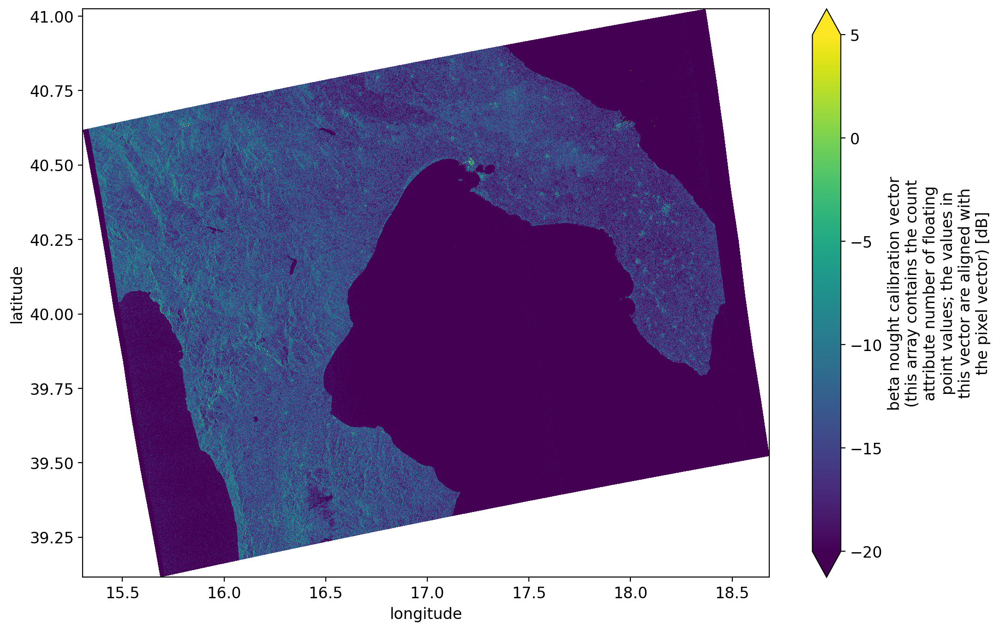

In [92]:
_ = betaNought_block_db.plot(x="longitude", y="latitude", vmin=-20, vmax=5)

In [56]:
noise_range = xr.open_dataset(
    url, engine="zarr", group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH/quality/noise_range"
)
noise_range

<xarray.Dataset> Size: 77kB
Dimensions:           (azimuth_time: 26, slant_range_time: 661)
Coordinates:
  * azimuth_time      (azimuth_time) datetime64[ns] 208B 2017-05-08T16:48:30....
    line              (azimuth_time) int32 104B ...
    pixel             (slant_range_time) int32 3kB ...
  * slant_range_time  (slant_range_time) float64 5kB 0.005337 0.005337 ... -1.0
Data variables:
    noise_range_lut   (azimuth_time, slant_range_time) float32 69kB ...

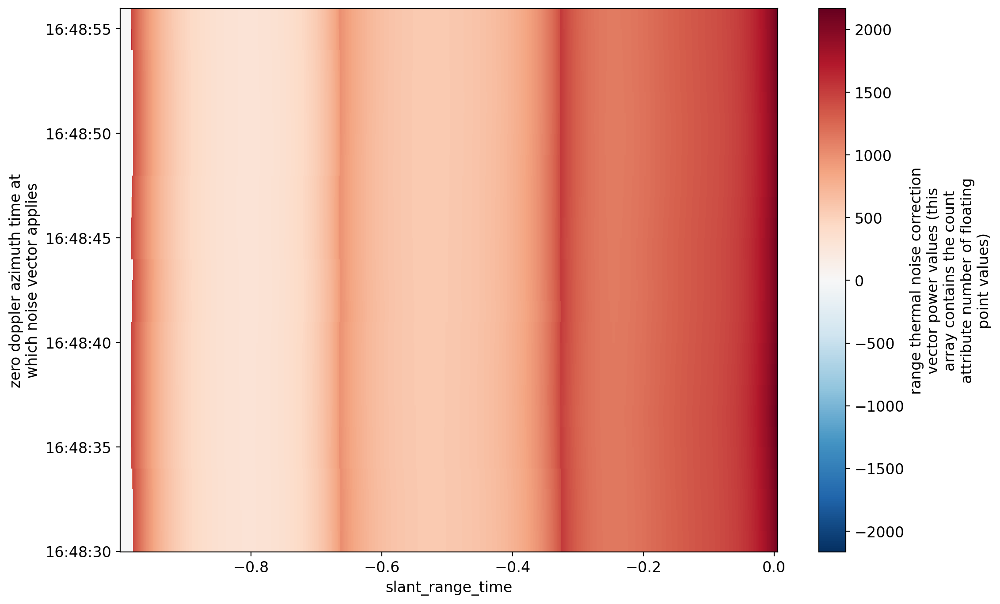

In [63]:
noise_range.noise_range_lut.plot.imshow()
plt.show()
# _ = noise_range.noise_range_lut.plot(y="azimuth_time", x="slant_range_time")

In [64]:
coordinate_conversion = xr.open_dataset(
    url,
    engine="zarr",
    group="/S01SIWGRD_20170508T164830_0025_A094_8604_01B54C_VH/conditions/coordinate_conversion",
)
coordinate_conversion

<xarray.Dataset> Size: 5kB
Dimensions:            (azimuth_time: 28, degree: 9)
Coordinates:
  * azimuth_time       (azimuth_time) datetime64[ns] 224B 2017-05-08T16:48:28...
Dimensions without coordinates: degree
Data variables:
    gr0                (azimuth_time) float64 224B ...
    grsr_coefficients  (azimuth_time, degree) float64 2kB ...
    slant_range_time   (azimuth_time) float64 224B ...
    sr0                (azimuth_time) float64 224B ...
    srgr_coefficients  (azimuth_time, degree) float64 2kB ...

In [ ]:
xr.open_dataset(
    product_path, engine="sentinel-1", group=f"{swath_polarisation_group}/attitude"
)

In [ ]:
xr.open_dataset(
    product_path, engine="sentinel-1", group=f"{swath_polarisation_group}/dc_estimate"
)

In [ ]:
xr.open_dataset(
    product_path,
    engine="sentinel-1",
    group=f"{swath_polarisation_group}/azimuth_fm_rate",
)